In [2]:
pip install -U albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.6/290.6 kB 7.3 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 16.8 MB/s eta 0:00:0000:01
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20
Note: you may need to restart the kernel to use updated packages.


**Imports**

In [ ]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
from tensorflow import keras
from keras.layers import (Dense, Dropout, Input, Conv2D, BatchNormalization, 
                         MaxPooling2D, Conv2DTranspose, Activation, Concatenate)
import albumentations as A
from sklearn.model_selection import train_test_split

Road Segmentation from Aerial Images - Implementation
Train images found: 1108
Train masks found: 1108
Training samples: 997
Validation samples: 111
Visualizing some training samples...


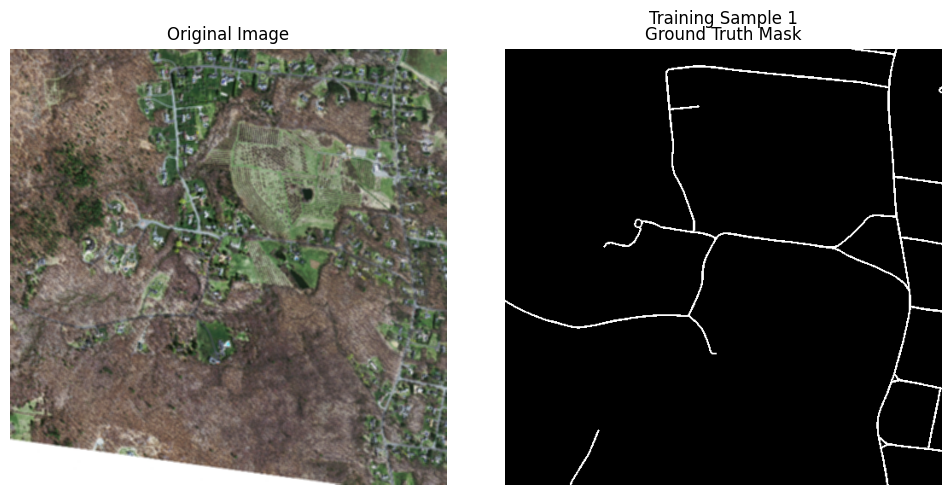

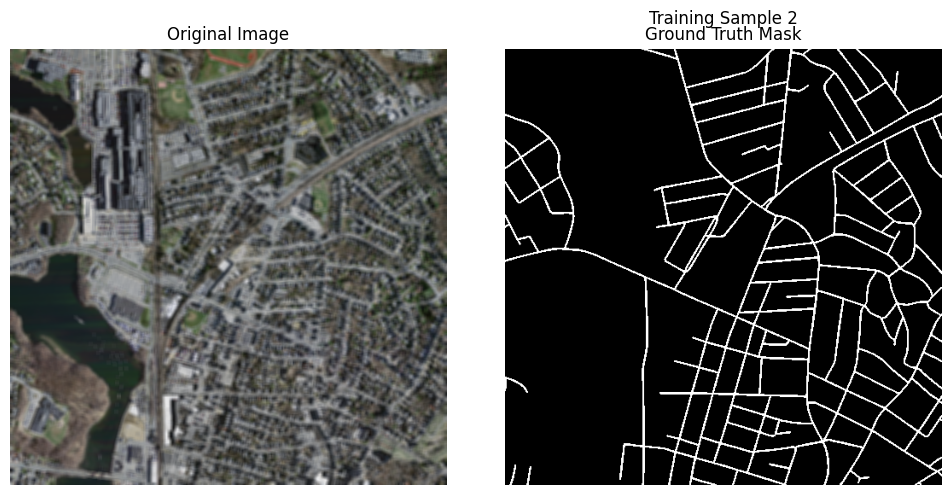

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 512, 512, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 512, 512, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 512, 512, 64)   │            256 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 512, 512, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 512, 512, 64)   │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 512, 512, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 512, 512, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 256, 256, 64)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 256, 256, 64)   │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv1 (Conv2D)     │ (None, 256, 256, 128)  │         73,856 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 256, 256, 128)  │            512 │ block2_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 256, 256, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_conv2 (Conv2D)     │ (None, 256, 256, 128)  │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 256, 256, 128)  │            512 │ block2_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 256, 256, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 128, 128, 128)  │              0 │ activation_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)  

 Total params: 7,709,121 (29.41 MB)

 Trainable params: 7,703,489 (29.39 MB)

 Non-trainable params: 5,632 (22.00 KB)


Starting model training for 15 epochs...
Epoch 1/15
250/250 ━━━━━━━━━━━━━━━━━━━━ 386s 1s/step - dice_coef: 0.2935 - iou_score: 0.1804 - loss: 0.7066 - val_dice_coef: 0.0146 - val_iou_score: 0.0075 - val_loss: 0.9852 - learning_rate: 5.0000e-04
Epoch 2/15
250/250 ━━━━━━━━━━━━━━━━━━━━ 272s 913ms/step - dice_coef: 0.5530 - iou_score: 0.3860 - loss: 0.4471 - val_dice_coef: 0.2853 - val_iou_score: 0.1726 - val_loss: 0.7136 - learning_rate: 5.0000e-04
Epoch 3/15
250/250 ━━━━━━━━━━━━━━━━━━━━ 271s 913ms/step - dice_coef: 0.5907 - iou_score: 0.4237 - loss: 0.4096 - val_dice_coef: 0.5991 - val_iou_score: 0.4323 - val_loss: 0.4010 - learning_rate: 5.0000e-04
Epoch 4/15
250/250 ━━━━━━━━━━━━━━━━━━━━ 271s 910ms/step - dice_coef: 0.5918 - iou_score: 0.4257 - loss: 0.4082 - val_dice_coef: 0.5873 - val_iou_score: 0.4203 - val_loss: 0.4121 - learning_rate: 5.0000e-04
Epoch 5/15
250/250 ━━━━━━━━━━━━━━━━━━━━ 270s 910ms/step - dice_coef: 0.6065 - iou_score: 0.4401 - loss: 0.3935 - val_dice_coef: 0.5934 - 

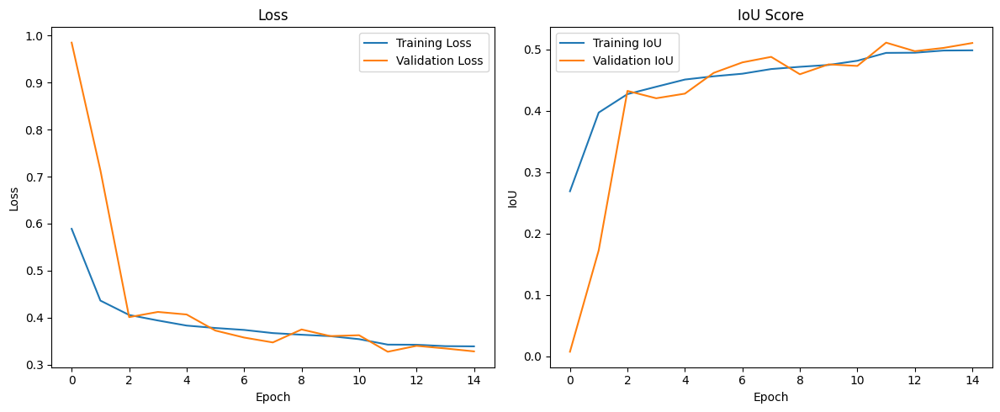


Evaluating on validation dataset...
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 298ms/step - dice_coef: 0.6649 - iou_score: 0.5000 - loss: 0.3351

Test Results:
loss: 0.3259
compile_metrics: 0.6740

Visualizing predictions...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


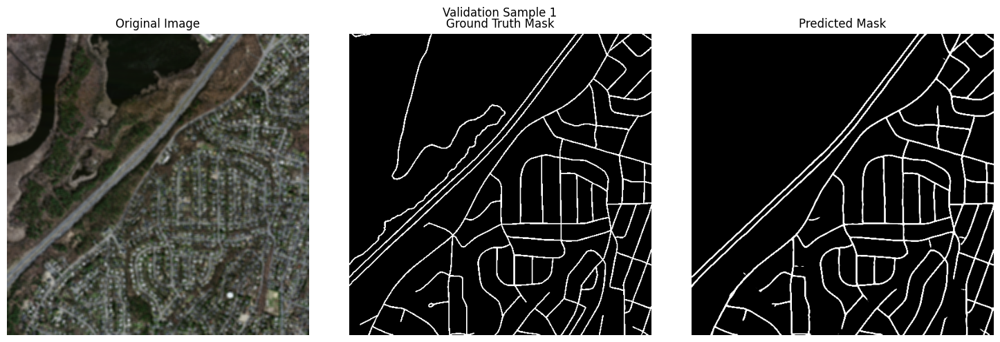

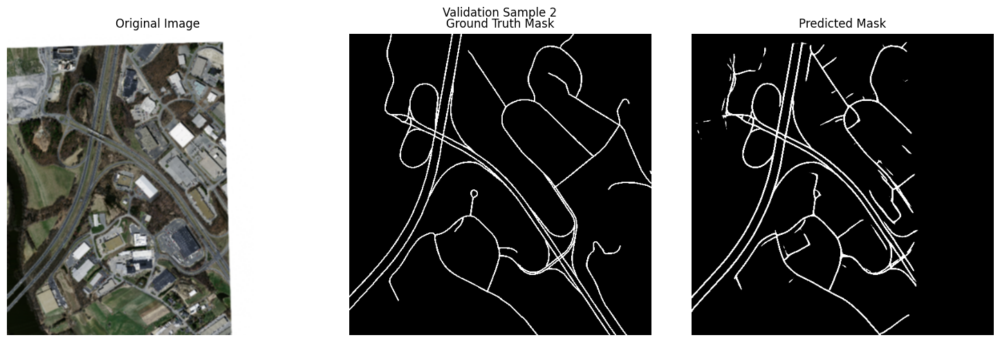

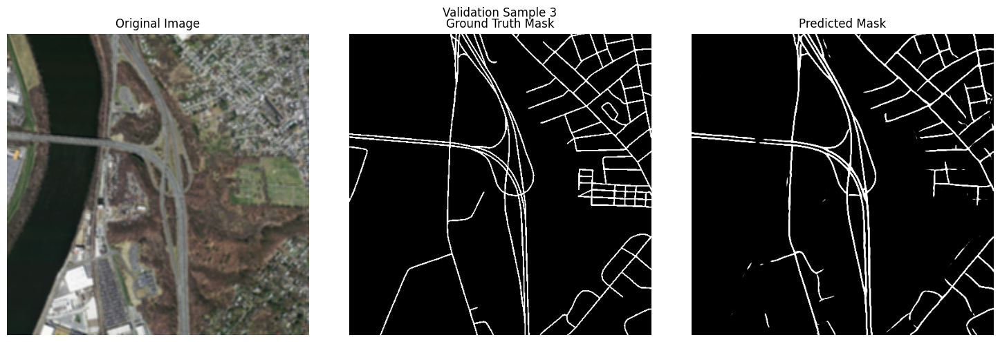

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


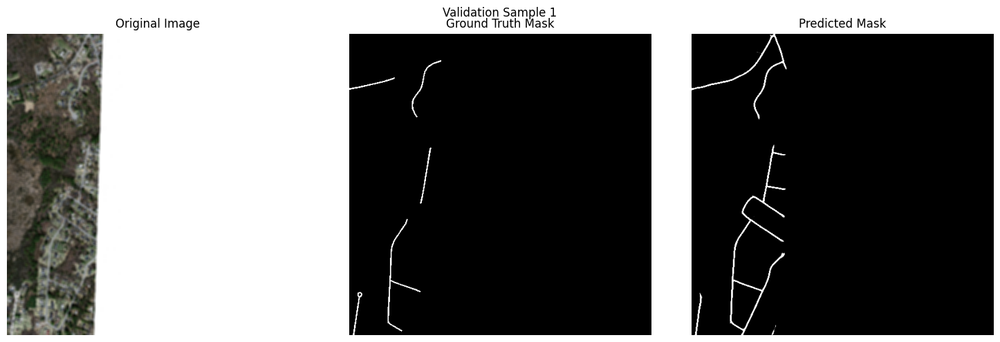

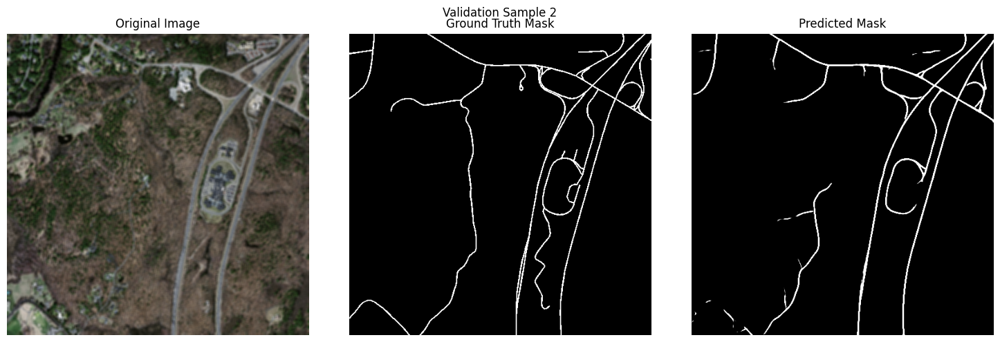

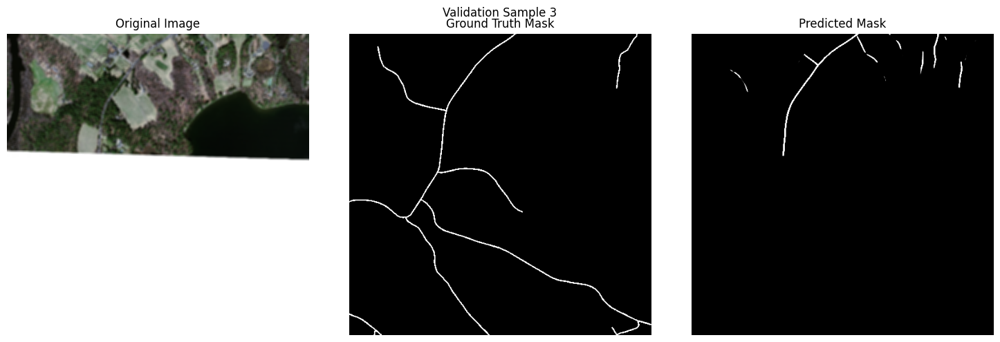

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


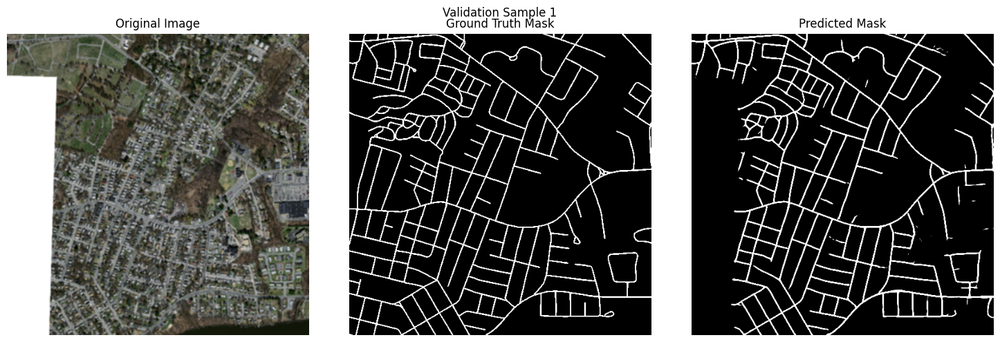

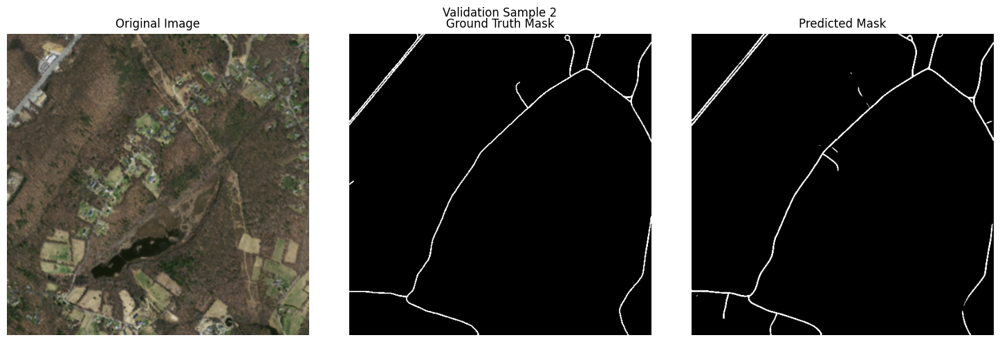

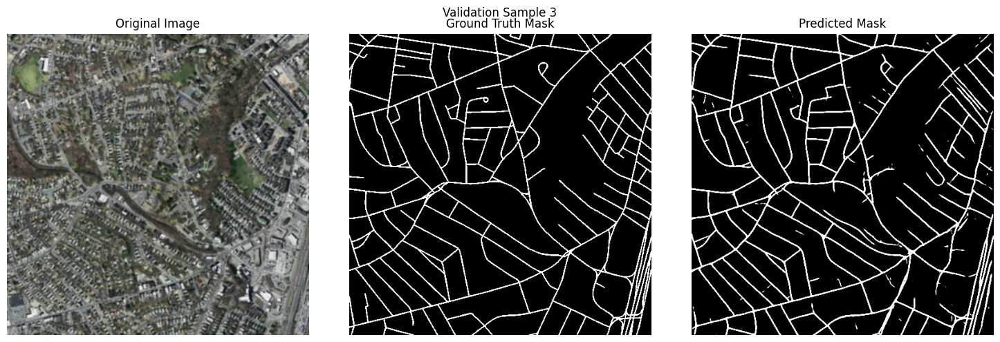

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


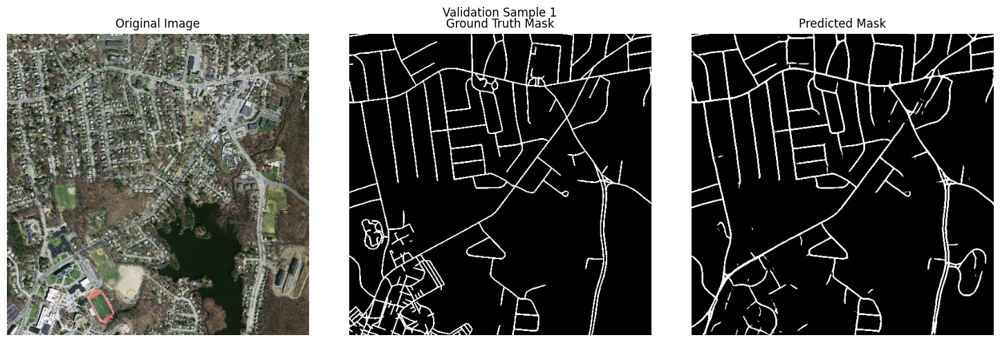

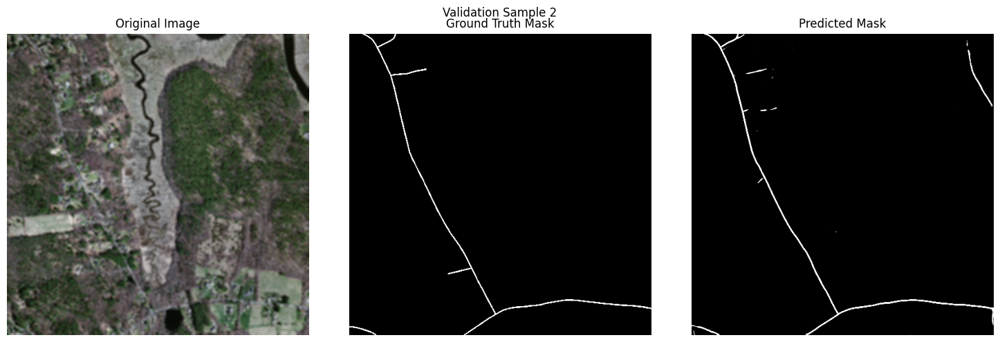

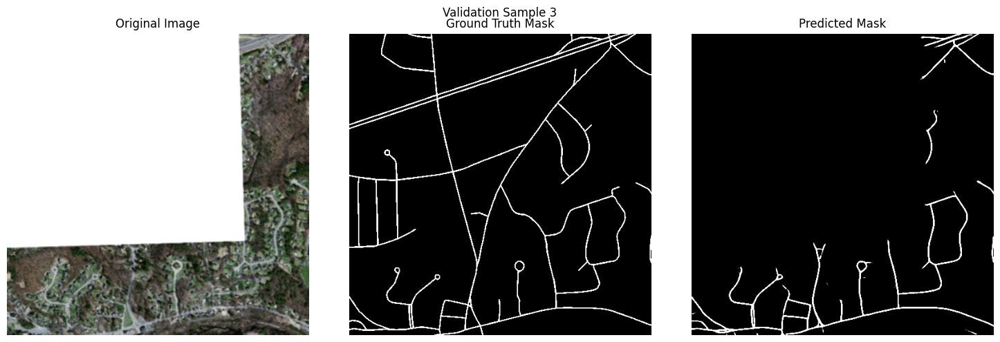

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


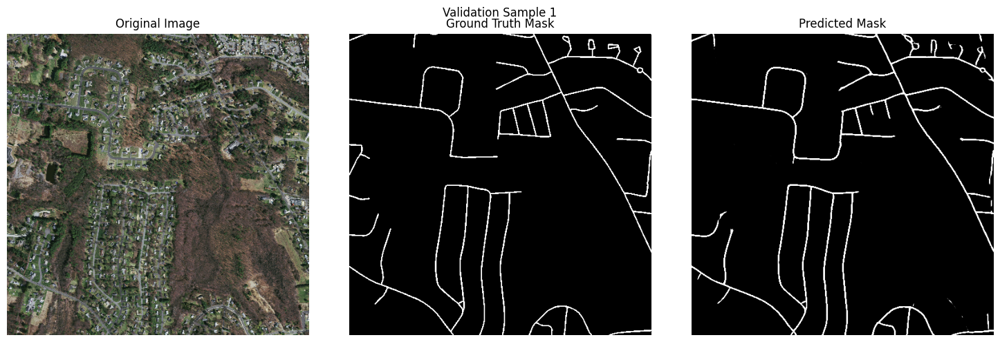

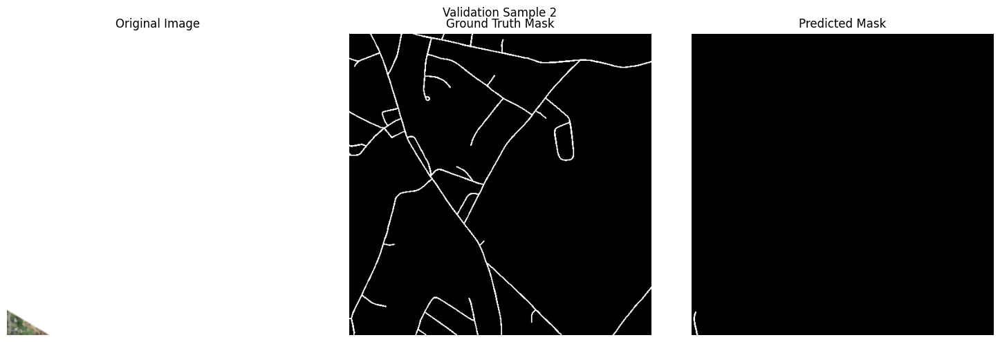

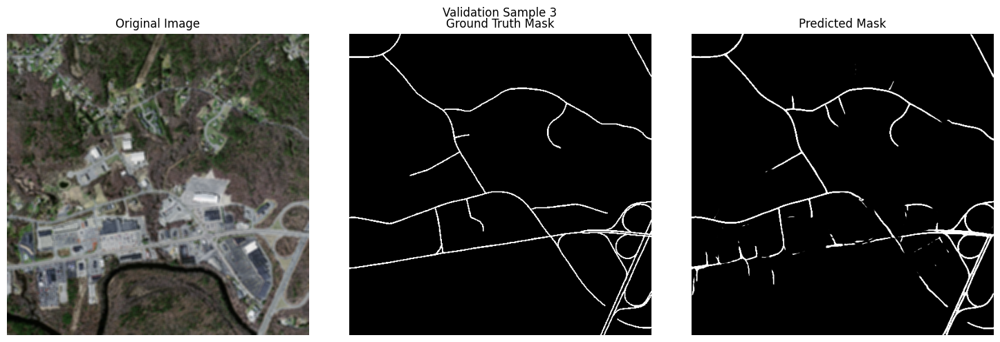


Training and evaluation completed successfully!
Final model saved as 'final_road_segmentation_model.keras'


In [9]:
# -------------------
# Configuration Module
# -------------------
class Config:
    IMG_SIZE = (512, 512)
    IMG_SHAPE = (IMG_SIZE[0], IMG_SIZE[1], 3)
    MASK_SHAPE = (IMG_SIZE[0], IMG_SIZE[1], 1)
    BATCH_SIZE = 4
    EPOCHS = 15
    LEARNING_RATE = 5e-4
    BUFFER_SIZE = 1000
    NUM_CLASSES = 1
    SEED = 42
    TRAIN_IMAGES_PATH = '/kaggle/input/massachusetts-roads-dataset/tiff/train'
    TRAIN_MASKS_PATH = '/kaggle/input/massachusetts-roads-dataset/tiff/train_labels'

# -------------------
# Data Module
# -------------------
def setup_dataset(config):
    """Setup dataset paths and verify contents."""
    print(f"Train images found: {len(os.listdir(config.TRAIN_IMAGES_PATH))}")
    print(f"Train masks found: {len(os.listdir(config.TRAIN_MASKS_PATH))}")
    return config.TRAIN_IMAGES_PATH, config.TRAIN_MASKS_PATH

class Augmentation:
    """Handle data augmentation."""
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build_augmentation(self, h_flip_prob=0.5, blur_prob=0.85, blur_limit=5):
        return A.Compose([
            A.HorizontalFlip(p=h_flip_prob),
            A.Blur(blur_limit=blur_limit, p=blur_prob)
        ])

class DataManager:
    """Manage data loading, preprocessing, and dataset creation."""
    def __init__(self, config, train_path, mask_path):
        self.config = config
        self.train_path = train_path
        self.mask_path = mask_path
        self.augmentor = Augmentation(config.IMG_SHAPE)
        self.transform = self.augmentor.build_augmentation()

    def build_data(self, path):
        return [os.path.join(path, name) for name in sorted(os.listdir(path))]

    def build_df(self):
        sat_images = self.build_data(self.train_path)
        mask_images = self.build_data(self.mask_path)
        assert len(sat_images) == len(mask_images), "Number of images and masks don't match"
        return pd.DataFrame({'Image': sat_images, 'Mask': mask_images})

    def modify_mask(self, mask, threshold=100):
        if len(mask.shape) == 3 and mask.shape[2] > 1:
            mask = cv.cvtColor(mask, cv.COLOR_RGB2GRAY)
        mask = np.expand_dims(mask, axis=2)
        return (mask >= threshold).astype(np.float32)

    def map_function(self, img_path, mask_path):
        img_path = img_path.decode() if isinstance(img_path, bytes) else img_path
        mask_path = mask_path.decode() if isinstance(mask_path, bytes) else mask_path
        
        try:
            img = plt.imread(img_path)
            mask = plt.imread(mask_path)
        except Exception as e:
            print(f"Error reading files: {e}")
            img = np.zeros(self.config.IMG_SHAPE)
            mask = np.zeros(self.config.IMG_SIZE)
        
        img = cv.resize(img, self.config.IMG_SIZE)
        mask = cv.resize(mask, self.config.IMG_SIZE)
        mask = self.modify_mask(mask)
        img = img / 255.0
        
        transformed = self.transform(image=img, mask=mask)
        return transformed['image'].astype(np.float32), transformed['mask'].astype(np.float32)

    def create_dataset(self, batch_size, buffer_size, validation_split=0.1):
        data = self.build_df()
        train_df, val_df = train_test_split(data, test_size=validation_split, random_state=self.config.SEED)
        
        print(f"Training samples: {len(train_df)}")
        print(f"Validation samples: {len(val_df)}")
        
        def create_ds(df):
            ds = tf.data.Dataset.from_tensor_slices((df['Image'], df['Mask']))
            ds = ds.map(
                lambda img, mask: tf.numpy_function(
                    self.map_function, [img, mask], [tf.float32, tf.float32]
                ),
                num_parallel_calls=tf.data.AUTOTUNE
            )
            ds = ds.map(
                lambda x, y: (tf.ensure_shape(x, self.config.IMG_SHAPE), 
                            tf.ensure_shape(y, self.config.MASK_SHAPE))
            )
            return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
        
        train_dataset = create_ds(train_df).shuffle(buffer_size)
        val_dataset = create_ds(val_df)
        return train_dataset, val_dataset

# -------------------
# Model Module
# -------------------
class RoadSegmentationModel:
    """Define U-Net model and metrics."""
    def __init__(self, config):
        self.config = config

    @staticmethod
    def dice_coef(y_true, y_pred):
        y_true_f = tf.reshape(tf.cast(y_true, tf.float32), [-1])
        y_pred_f = tf.reshape(tf.cast(y_pred, tf.float32), [-1])
        intersection = tf.reduce_sum(y_true_f * y_pred_f)
        return (2. * intersection + 1.0) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + 1.0)

    @staticmethod
    def dice_coef_loss(y_true, y_pred):
        return 1 - RoadSegmentationModel.dice_coef(y_true, y_pred)

    @staticmethod
    def iou_score(y_true, y_pred):
        y_true_f = tf.reshape(tf.cast(y_true, tf.float32), [-1])
        y_pred_f = tf.reshape(tf.cast(y_pred, tf.float32), [-1])
        intersection = tf.reduce_sum(y_true_f * y_pred_f)
        union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
        return (intersection + 1.0) / (union + 1.0)

    def build_unet(self, units=64, dropout=0.1):
        inp = Input(self.config.IMG_SHAPE)
        
        def conv_block(x, filters, name):
            x = Conv2D(filters, (3, 3), padding='same', name=f'{name}_conv1')(x)
            x = BatchNormalization()(x)
            x = Activation('relu')(x)
            x = Conv2D(filters, (3, 3), padding='same', name=f'{name}_conv2')(x)
            x = BatchNormalization()(x)
            return Activation('relu')(x)

        # Encoder
        c1 = conv_block(inp, units, 'block1')
        p1 = MaxPooling2D()(c1)
        p1 = Dropout(dropout)(p1)

        c2 = conv_block(p1, units * 2, 'block2')
        p2 = MaxPooling2D()(c2)
        p2 = Dropout(dropout)(p2)

        c3 = conv_block(p2, units * 4, 'block3')
        p3 = MaxPooling2D()(c3)
        p3 = Dropout(dropout)(p3)

        c4 = conv_block(p3, units * 8, 'block4')

        # Decoder
        u3 = Conv2DTranspose(units * 4, (2, 2), strides=(2, 2), padding='same')(c4)
        u3 = Concatenate()([u3, c3])
        c5 = conv_block(u3, units * 4, 'block5')

        u2 = Conv2DTranspose(units * 2, (2, 2), strides=(2, 2), padding='same')(c5)
        u2 = Concatenate()([u2, c2])
        c6 = conv_block(u2, units * 2, 'block6')

        u1 = Conv2DTranspose(units, (2, 2), strides=(2, 2), padding='same')(c6)
        u1 = Concatenate()([u1, c1])
        c7 = conv_block(u1, units, 'block7')

        out = Conv2D(self.config.NUM_CLASSES, (3, 3), activation='sigmoid', padding='same')(c7)

        model = keras.models.Model(inputs=inp, outputs=out)
        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=self.config.LEARNING_RATE),
            loss=self.dice_coef_loss,
            metrics=[self.dice_coef, self.iou_score]
        )
        return model

# -------------------
# Visualization Module
# -------------------
class Visualizer:
    """Handle visualization of samples and predictions."""
    @staticmethod
    def visualize_sample(image, mask, prediction=None, title='Sample'):
        plt.figure(figsize=(15, 5))
        plt.subplot(131)
        plt.imshow(image)
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(132)
        plt.imshow(mask[:,:,0], cmap='gray')
        plt.title('Ground Truth Mask')
        plt.axis('off')
        
        if prediction is not None:
            plt.subplot(133)
            plt.imshow(prediction[:,:,0], cmap='gray')
            plt.title('Predicted Mask')
            plt.axis('off')
        
        plt.suptitle(title)
        plt.tight_layout()
        plt.show()

    @staticmethod
    def visualize_predictions(model, dataset, num_samples=5):
        for images, masks in dataset.take(num_samples):
            predictions = model.predict(images)
            for i in range(min(len(images), 3)):
                Visualizer.visualize_sample(
                    image=images[i].numpy(),
                    mask=masks[i].numpy(),
                    prediction=predictions[i],
                    title=f'Validation Sample {i+1}'
                )

    @staticmethod
    def plot_history(history):
        plt.figure(figsize=(12, 5))
        plt.subplot(121)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        
        plt.subplot(122)
        plt.plot(history.history['iou_score'], label='Training IoU')
        plt.plot(history.history['val_iou_score'], label='Validation IoU')
        plt.title('IoU Score')
        plt.xlabel('Epoch')
        plt.ylabel('IoU')
        plt.legend()
        
        plt.tight_layout()
        plt.savefig('training_history.png')
        plt.show()

# -------------------
# Training Module
# -------------------
class Trainer:
    """Manage model training and evaluation."""
    @staticmethod
    def get_callbacks(config):
        return [
            keras.callbacks.ModelCheckpoint(
                'road_segmentation_model.keras',
                save_best_only=True,
                monitor='val_iou_score',
                mode='max'
            ),
            keras.callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=3,
                verbose=1
            ),
            keras.callbacks.EarlyStopping(
                monitor='val_loss',
                patience=10,
                verbose=1
            ),
            keras.callbacks.TensorBoard(
                log_dir='./logs',
                write_graph=True,
                update_freq='epoch'
            )
        ]

    @staticmethod
    def train_model(model, train_dataset, val_dataset, config):
        print(f"\nStarting model training for {config.EPOCHS} epochs...")
        history = model.fit(
            train_dataset,
            validation_data=val_dataset,
            epochs=config.EPOCHS,
            callbacks=Trainer.get_callbacks(config)
        )
        return history

    @staticmethod
    def evaluate_model(model, dataset):
        results = model.evaluate(dataset)
        print("\nTest Results:")
        for name, value in zip(model.metrics_names, results):
            print(f"{name}: {value:.4f}")
        return results

# -------------------
# Main Script
# -------------------
def main():
    print("Road Segmentation from Aerial Images - Implementation")
    
    config = Config()
    train_path, mask_path = setup_dataset(config)
    
    # Data Prep
    data_manager = DataManager(config, train_path, mask_path)
    train_dataset, val_dataset = data_manager.create_dataset(
        batch_size=config.BATCH_SIZE,
        buffer_size=config.BUFFER_SIZE
    )
    
    print("Visualizing some training samples...")
    for images, masks in train_dataset.take(1):
        for i in range(min(len(images), 2)):
            Visualizer.visualize_sample(
                image=images[i].numpy(),
                mask=masks[i].numpy(),
                title=f'Training Sample {i+1}'
            )

    
    model_builder = RoadSegmentationModel(config)
    model = model_builder.build_unet()
    model.summary()
    
    # Training 
    history = Trainer.train_model(model, train_dataset, val_dataset, config)
    
    Visualizer.plot_history(history)
    
    model = keras.models.load_model(
        'road_segmentation_model.keras',
        custom_objects={
            'dice_coef_loss': RoadSegmentationModel.dice_coef_loss,
            'dice_coef': RoadSegmentationModel.dice_coef,
            'iou_score': RoadSegmentationModel.iou_score
        }
    )
    
    print("\nEvaluating on validation dataset...")
    Trainer.evaluate_model(model, val_dataset)
    
    print("\nVisualizing predictions...")
    Visualizer.visualize_predictions(model, val_dataset)
    
    # Save_final
    model.save('final_road_segmentation_model.keras')
    print("\nTraining and evaluation completed successfully!")
    print("Final model saved as 'final_road_segmentation_model.keras'")

if __name__ == "__main__":
    main()